In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report
from visualize_classifier_with_title import visualize_classifier_with_title
%matplotlib inline

In [2]:
data = np.loadtxt("../input/data_random_forests.txt", delimiter=",")
data[:5]

array([[5.88, 6.2 , 0.  ],
       [5.7 , 3.59, 1.  ],
       [3.42, 4.47, 2.  ],
       [7.55, 7.67, 0.  ],
       [7.16, 2.65, 1.  ]])

In [3]:
X = data[:, :-1]
y = data[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y)

<AxesSubplot:>

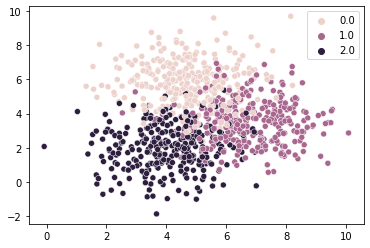

In [4]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y)

In [5]:
 model_rf = RandomForestClassifier(random_state=0, n_estimators=100, max_depth=4)
 model_erf = ExtraTreesClassifier(random_state=0, n_estimators=100, max_depth=4)

 model_rf.fit(X_train, y_train)
 model_erf.fit(X_train, y_train)

ExtraTreesClassifier(max_depth=4, random_state=0)

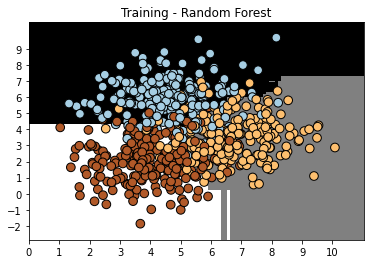

In [6]:
visualize_classifier_with_title(model_rf, X_train, y_train, "Training - Random Forest")

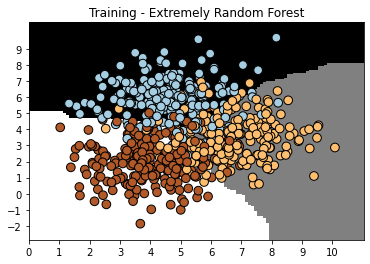

In [7]:
visualize_classifier_with_title(model_erf, X_train, y_train, "Training - Extremely Random Forest")

In [8]:
y_pred_rf = model_rf.predict(X_test)
y_pred_erf = model_erf.predict(X_test)

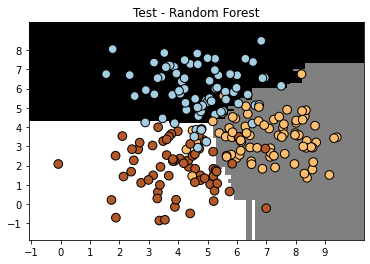

In [9]:
visualize_classifier_with_title(model_rf, X_test, y_test, "Test - Random Forest")

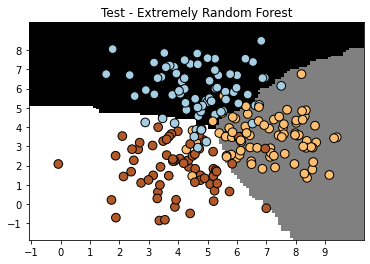

In [10]:
visualize_classifier_with_title(model_erf, X_test, y_test, "Test - Extremely Random Forest")

In [12]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.97      0.82      0.89        74
         1.0       0.88      0.91      0.90        81
         2.0       0.83      0.93      0.88        70

    accuracy                           0.89       225
   macro avg       0.89      0.89      0.89       225
weighted avg       0.89      0.89      0.89       225



In [13]:
print(classification_report(y_test, y_pred_erf))

              precision    recall  f1-score   support

         0.0       0.94      0.81      0.87        74
         1.0       0.89      0.90      0.90        81
         2.0       0.84      0.94      0.89        70

    accuracy                           0.88       225
   macro avg       0.89      0.88      0.88       225
weighted avg       0.89      0.88      0.88       225



In [14]:
test_datapoints = np.array([[5, 5], [3, 6], [6, 4], [7, 2], [4, 4], [5, 2]])

In [20]:
print("Random Forest confidence measure:")
for datapoint in test_datapoints:
    probabilities = model_rf.predict_proba([datapoint])[0]
    predicted_class = np.argmax(probabilities)
    print('\nDatapoint:', datapoint)
    print('Predicted class:', predicted_class)

Random Forest confidence measure:

Datapoint: [5 5]
Predicted class: 0

Datapoint: [3 6]
Predicted class: 0

Datapoint: [6 4]
Predicted class: 1

Datapoint: [7 2]
Predicted class: 1

Datapoint: [4 4]
Predicted class: 2

Datapoint: [5 2]
Predicted class: 2


In [21]:
print("Random Forest confidence measure:")
for datapoint in test_datapoints:
    probabilities = model_erf.predict_proba([datapoint])[0]
    predicted_class = np.argmax(probabilities)
    print('\nDatapoint:', datapoint)
    print('Predicted class:', predicted_class)

Random Forest confidence measure:

Datapoint: [5 5]
Predicted class: 0

Datapoint: [3 6]
Predicted class: 0

Datapoint: [6 4]
Predicted class: 1

Datapoint: [7 2]
Predicted class: 1

Datapoint: [4 4]
Predicted class: 2

Datapoint: [5 2]
Predicted class: 2
